In [25]:
import numpy as np
import pandas as pd
import scanpy as sc
import harmonypy as hm
import anndata
import os
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import scipy.io as io

sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(5,5), facecolor='white')

# set random seed for reproducibility:
np.random.seed(42)


In [26]:
# set working dir 
os.chdir('/dfs3b/swaruplab/shared_lab/cross-disorder/analysis/individual/Nagy_2020')

fig_dir = 'figures/'
data_dir = 'data/'


In [17]:
# re-load processed data:
adata = sc.read_h5ad('{}/Nagy_2020_processed.h5ad'.format(data_dir))

## Load data

In [27]:
count_data_dir = '/dfs3b/swaruplab/shared_lab/cross-disorder/count_matrices/MDD_Nagy_2020/'
samples = [s for s in os.listdir(count_data_dir)]

adata_list = []
for sample in samples:
    try:
        adata = sc.read_h5ad('{}{}/scanpy_preprocessing_cellbender/data/adata_unfiltered.h5ad'.format(count_data_dir, sample))
    except:
        print('sample', sample, ' error')
        continue
    adata.obs['Sample'] = sample
    adata.obs['Study'] = 'Nagy_2020'
    adata.obs['orig_barcode'] = adata.obs.index
    
    adata_list.append(adata)
    
    print(sample, adata.shape)


GSM4281977 (2892, 36601)
GSM4281978 (3612, 36601)
GSM4281976 (3535, 36601)
GSM4281980 (4216, 36601)
GSM4281979 (3296, 36601)
GSM4281974 (6017, 36601)
GSM4281981 (5273, 36601)
GSM4281975 (3637, 36601)
GSM4281982 (2750, 36601)
GSM4281983 (3741, 36601)
GSM4281984 (5159, 36601)
GSM4281985 (4098, 36601)
GSM4281986 (4822, 36601)
GSM4281987 (2253, 36601)
GSM4281990 (6075, 36601)
GSM4281988 (4960, 36601)
GSM4281989 (1981, 36601)
GSM4281991 (3237, 36601)
GSM4281993 (5165, 36601)
GSM4281992 (4176, 36601)
GSM4281994 (2715, 36601)
GSM4281995 (3046, 36601)
GSM4281996 (5175, 36601)
GSM4281997 (2758, 36601)
GSM4281998 (5479, 36601)
GSM4281999 (3781, 36601)
GSM4282000 (3872, 36601)
GSM4282001 (5000, 36601)
GSM4282002 (4920, 36601)
GSM4282003 (5095, 36601)
GSM4282004 (5157, 36601)
GSM4282005 (3659, 36601)
GSM4282006 (2860, 36601)
GSM4282007 (4577, 36601)


In [28]:
adata_list[1].layers

Layers with keys: spliced, unspliced

In [30]:
# concatenate
adata = adata_list[0].concatenate(adata_list[1:])
adata.obs['barcode'] = adata.obs.index

# filter really small cells
sc.pp.filter_cells(adata, min_counts = 250)

# add counts layer
adata.layers["counts"] = adata.X.copy()

# print shape of dataset
adata.shape


(124068, 36601)

### Add sample metadata


In [31]:
sample_meta = pd.read_csv(
    '/dfs3b/swaruplab/shared_lab/cross-disorder/meta_data/MDD_Nagy/MDD_SRR.txt',
    sep=','
)

sample_meta = sample_meta[['GEO_Accession (exp)', 'Group', 'ETHNICITY', 'sex']]
sample_meta = sample_meta.drop_duplicates()

# need to match the databases by "Sample" in adata.obs and
temp = adata.obs.merge(
    sample_meta, how='left', 
    left_on = 'Sample', right_on = 'GEO_Accession (exp)'
)
temp.index = temp.barcode
adata.obs = temp
adata.obs.index.name = None


In [32]:
# save unfiltered dataset:
adata.write_h5ad('{}Nagy_2020_unfiltered.h5ad'.format(data_dir))


... storing 'orig_barcode' as categorical
... storing 'doublets' as categorical
... storing 'Sample' as categorical
... storing 'Study' as categorical
... storing 'GEO_Accession (exp)' as categorical
... storing 'Group' as categorical
... storing 'ETHNICITY' as categorical
... storing 'sex' as categorical


In [33]:
# save the sparse matrix for Seurat:
X = adata.X 
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}Nagy_2020_unfiltered.mtx'.format(data_dir), X)

In [34]:
# save the obs table for Seurat:
adata.obs.to_csv('{}Nagy_2020_unfiltered.csv'.format(data_dir))

In [35]:
# save the var table for Seurat:
adata.var.to_csv('{}Nagy_2020_var_unfiltered.csv'.format(data_dir))

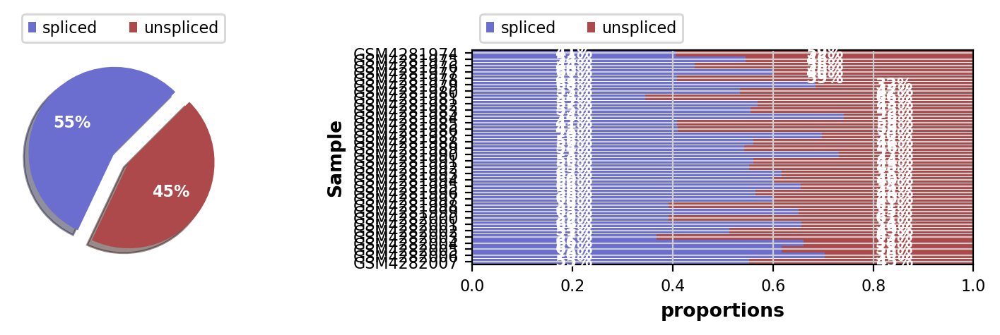

In [36]:
import scvelo as scv
scv.pl.proportions(adata, groupby='Sample')

## QC Filtering

In [42]:
# save unfiltered dataset:
adata = sc.read_h5ad('{}Nagy_2020_unfiltered.h5ad'.format(data_dir))


In [43]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

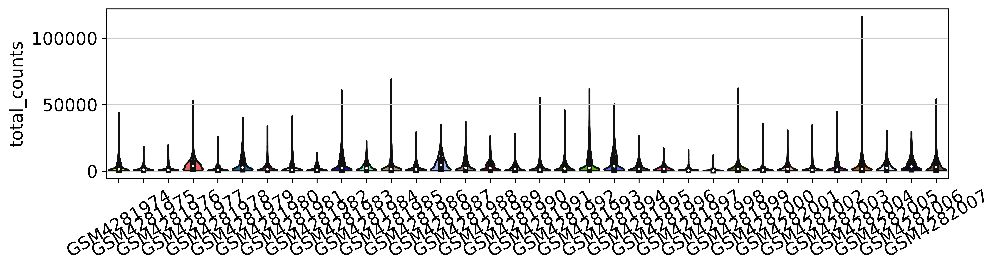

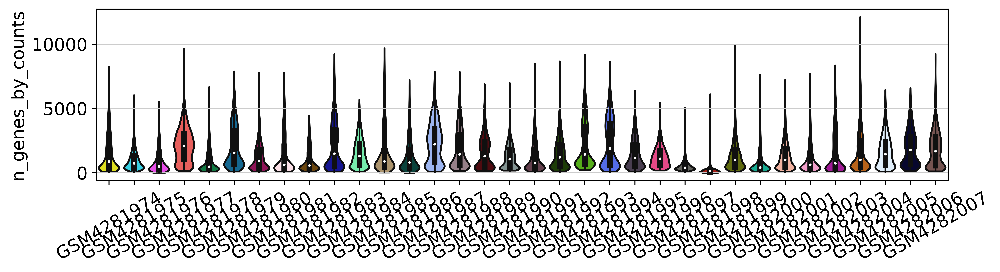

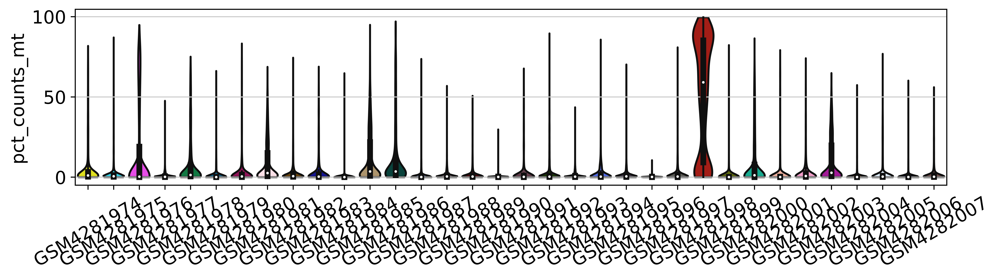

In [44]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='Sample', multi_panel=False, rotation=30)

In [45]:

mt_quantile = 0.95
umi_quantile = 0.95
doublet_quantile = 0.95

samples = adata.obs.Sample.value_counts().index.to_list()
good_barcodes = []
for cur_sample in samples:
    
    # get just this sample
    cur_adata = adata[adata.obs.Sample == cur_sample]
    orig_cells = cur_adata.shape[0]
    
    # compute cutoffs for each sample
    mt_cutoff = cur_adata.obs.pct_counts_mt.quantile(mt_quantile)
    umi_cutoff = cur_adata.obs.total_counts.quantile(umi_quantile)
    doublet_cutoff = cur_adata.obs.doublet_scores.quantile(doublet_quantile)
    
    # subset the data based on thresholds
    cur_adata = cur_adata[(cur_adata.obs.pct_counts_mt < mt_cutoff) & (cur_adata.obs.total_counts < umi_cutoff) & (cur_adata.obs.doublet_scores < doublet_cutoff)]
    new_cells = cur_adata.shape[0]
    
    keep_cells = cur_adata.obs.barcode.to_list() 
    good_barcodes = good_barcodes + keep_cells
    print(cur_sample, 'removed ', orig_cells-new_cells, ', kept ', new_cells)

    

GSM4281990 removed  781 , kept  4652
GSM4281993 removed  753 , kept  4410
GSM4281974 removed  789 , kept  4364
GSM4281984 removed  731 , kept  4260
GSM4282004 removed  756 , kept  4228
GSM4281996 removed  757 , kept  4184
GSM4281988 removed  741 , kept  4142
GSM4281981 removed  697 , kept  3841
GSM4282001 removed  675 , kept  3858
GSM4282003 removed  684 , kept  3718
GSM4282007 removed  679 , kept  3671
GSM4282002 removed  637 , kept  3568
GSM4281986 removed  613 , kept  3526
GSM4281985 removed  584 , kept  3328
GSM4281992 removed  588 , kept  3258
GSM4281980 removed  592 , kept  3169
GSM4281983 removed  560 , kept  3051
GSM4281999 removed  505 , kept  2984
GSM4282005 removed  506 , kept  2902
GSM4281979 removed  523 , kept  2723
GSM4281975 removed  454 , kept  2694
GSM4281995 removed  465 , kept  2476
GSM4282000 removed  454 , kept  2483
GSM4281977 removed  463 , kept  2409
GSM4281991 removed  431 , kept  2400
GSM4282006 removed  423 , kept  2407
GSM4281978 removed  435 , kept  2378
G

In [46]:
# subset the full data by the good barcodes
adata = adata[adata.obs.index.isin(good_barcodes)].copy()
adata

AnnData object with n_obs × n_vars = 105269 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'GEO_Accession (exp)', 'Group', 'ETHNICITY', 'sex', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Sample_colors'
    layers: 'counts', 'spliced', 'unspliced'

In [47]:
adata = adata[adata.obs.n_genes_by_counts >= 250].copy()
adata = adata[adata.obs.pct_counts_mt <= 10].copy()

adata

AnnData object with n_obs × n_vars = 91104 × 36601
    obs: 'orig_barcode', 'n_counts', 'doublet_scores', 'doublets', 'Sample', 'Study', 'batch', 'barcode', 'GEO_Accession (exp)', 'Group', 'ETHNICITY', 'sex', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Sample_colors'
    layers: 'counts', 'spliced', 'unspliced'

## process data:

In [48]:
# preserve the counts in its own layer
adata.layers['counts'] = adata.X

In [49]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

In [50]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'], n_jobs=16)
sc.pp.scale(adata, max_value=10)


In [51]:
sc.tl.pca(adata, svd_solver='arpack')

In [52]:
sc.external.pp.harmony_integrate(adata, key = 'Sample')

2022-03-15 14:30:08,713 - harmonypy - INFO - Iteration 1 of 10
2022-03-15 14:30:51,420 - harmonypy - INFO - Iteration 2 of 10
2022-03-15 14:31:33,861 - harmonypy - INFO - Iteration 3 of 10
2022-03-15 14:32:16,181 - harmonypy - INFO - Iteration 4 of 10
2022-03-15 14:33:00,566 - harmonypy - INFO - Iteration 5 of 10
2022-03-15 14:33:42,892 - harmonypy - INFO - Iteration 6 of 10
2022-03-15 14:34:12,953 - harmonypy - INFO - Iteration 7 of 10
2022-03-15 14:34:36,843 - harmonypy - INFO - Iteration 8 of 10
2022-03-15 14:34:57,934 - harmonypy - INFO - Iteration 9 of 10
2022-03-15 14:35:20,425 - harmonypy - INFO - Iteration 10 of 10
2022-03-15 14:35:42,374 - harmonypy - INFO - Stopped before convergence


In [53]:
sc.pp.neighbors(adata, use_rep = 'X_pca_harmony', n_neighbors=20, n_pcs=30, metric='cosine')

In [54]:
sc.tl.umap(adata, min_dist=0.35, method='umap')

In [55]:
sc.tl.leiden(adata, resolution=1)

#compute dendrogram for the dotplot:
sc.tl.dendrogram(adata, 'leiden')

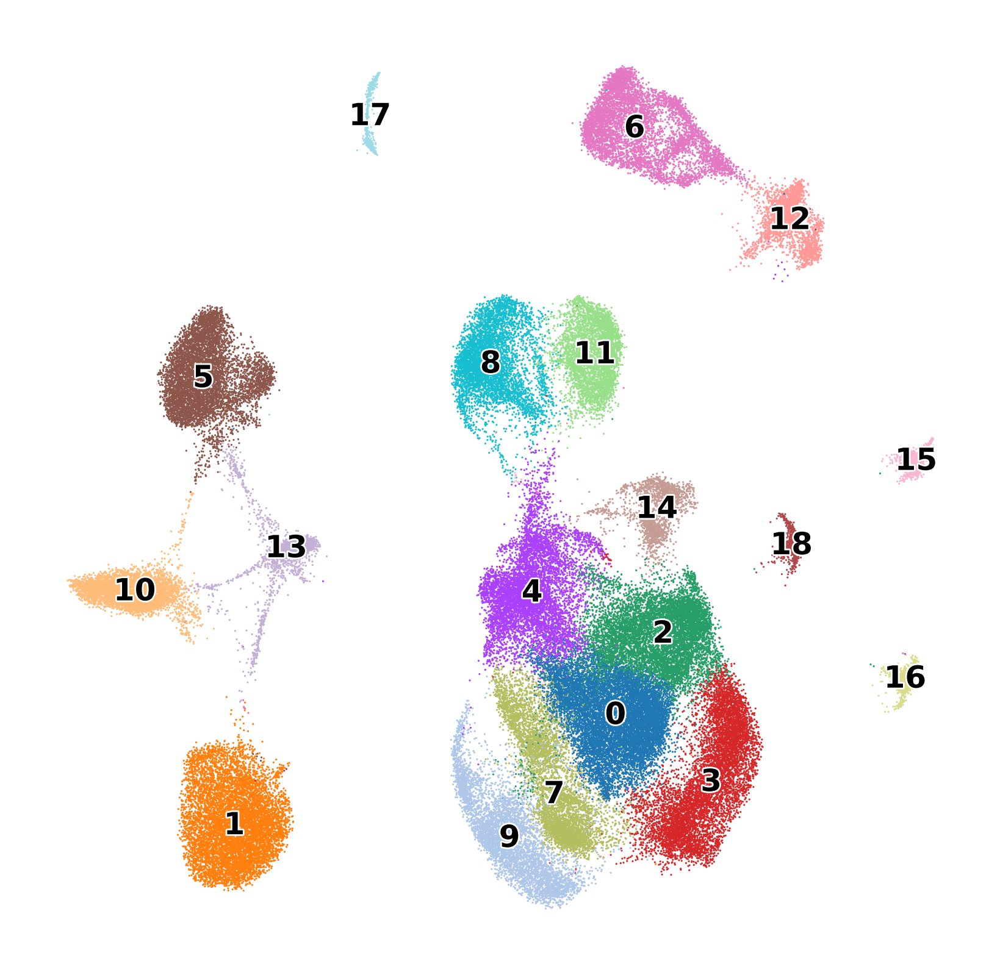

In [56]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['leiden'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=1, 
    legend_fontsize=9, 
    title='',
    save='_leiden.pdf'
)


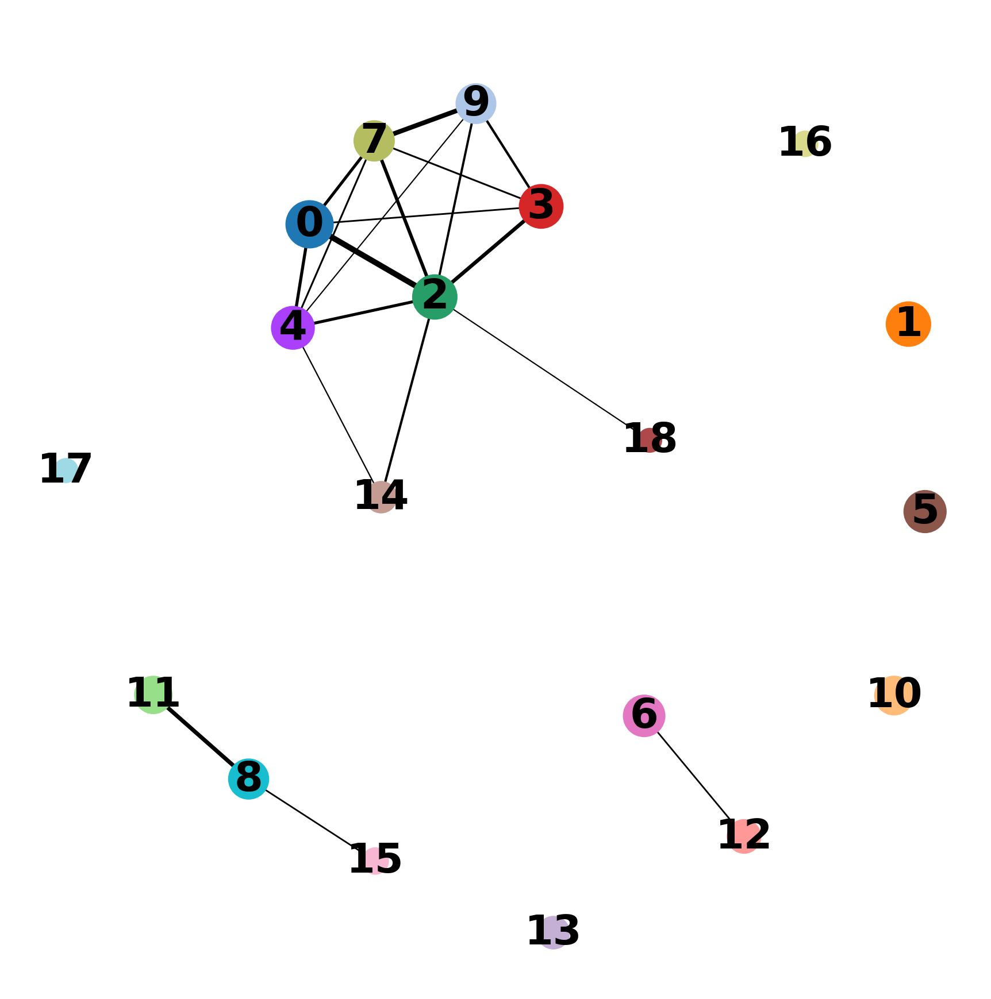

In [57]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.1, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [ ]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.4, init_pos='paga')

categories: 0, 1, 2, etc.
var_group_labels: Oligodendrocyte, Astrocyte, Microglia, etc.


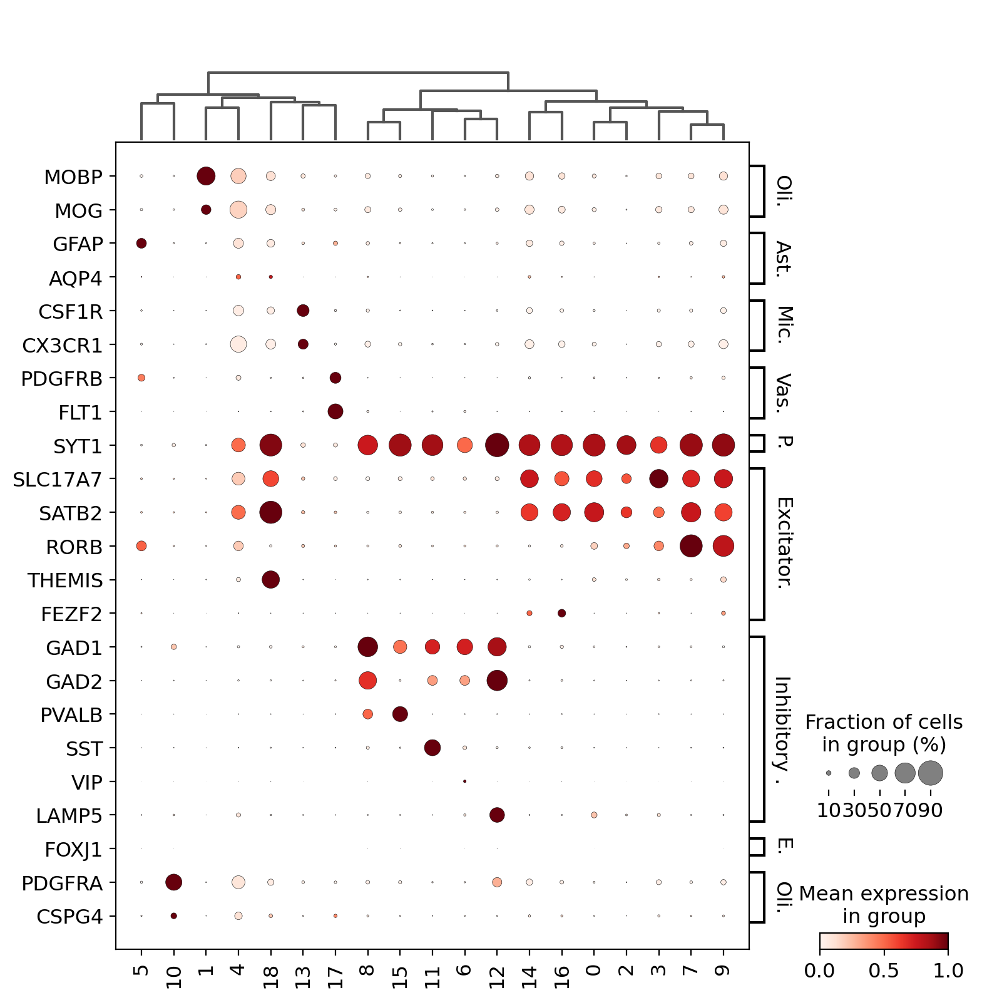

In [58]:
marker_dict = {
    'Oligodendrocyte': ['MOBP', 'MOG'],
    'Astrocyte': ['GFAP', 'AQP4'],
    'Microglia': ['CSF1R', 'CX3CR1',],
    'Vasculature': ['PDGFRB', 'FLT1'],
    'Pan-neuronal': ['SYT1'],
    'Excitatory Neuron': ['SLC17A7', 'SATB2', 'RORB', 'THEMIS', 'FEZF2'],
    'Inhibitory Neuron': ['GAD1', 'GAD2', 'PVALB', 'SST', 'VIP', 'LAMP5'],
    'Ependyma' : ['FOXJ1'], # not expressed
    'Oligodendrocyte Progenitor': ['PDGFRA', 'CSPG4']
}

sc.set_figure_params(dpi=100)
sc.pl.dotplot(
    adata, marker_dict, 'leiden', 
    dendrogram=True, 
    standard_scale='var', swap_axes=True
)


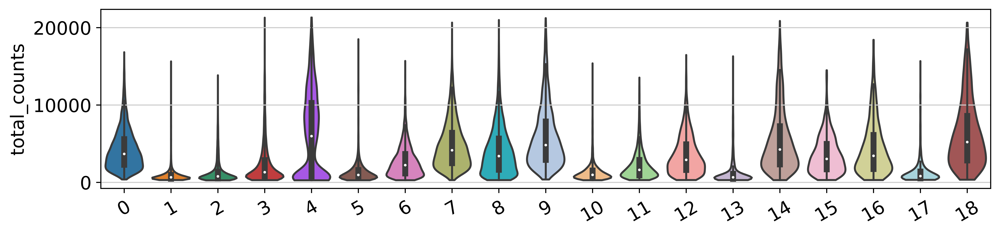

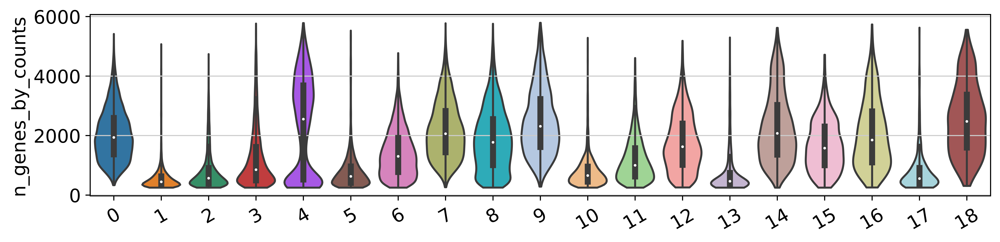

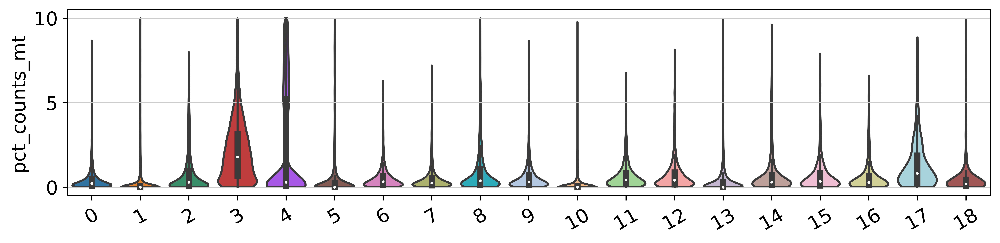

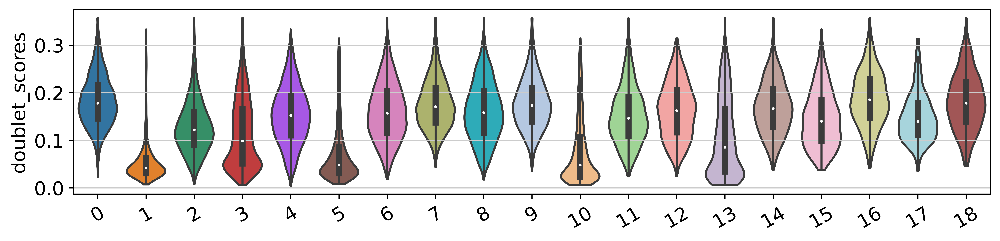

In [59]:
sc.settings.set_figure_params(dpi=500, dpi_save=1000, figsize=(10,2.5), facecolor='white')
sc.pl.violin(adata,[ 'total_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'n_genes_by_counts'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'pct_counts_mt'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)
sc.pl.violin(adata,[ 'doublet_scores'], inner='box', size=0,  groupby='leiden', multi_panel=False, rotation=30)

## Annotate clusters:

In [70]:
adata.obs = adata.obs.drop(['cell_type', 'annotation'], axis=1)

In [72]:

# load cluster anno df 
anno_df = pd.read_csv('data/Nagy_leiden_clusters.csv')

anno_df.leiden = anno_df.leiden.astype(str)
temp = adata.obs.merge(
    anno_df, how='left',
    on = 'leiden')

adata.obs['cell_type'] = temp['cell_type'].astype(str).to_list()
adata.obs['annotation'] = temp['annotation'].astype(str).to_list()


In [73]:
# remove unknown & doublet clusters
clusters_to_remove = ['Unknown', 'Doublet']
adata = adata[~adata.obs.annotation.isin(clusters_to_remove)].copy()


... storing 'cell_type' as categorical
... storing 'annotation' as categorical


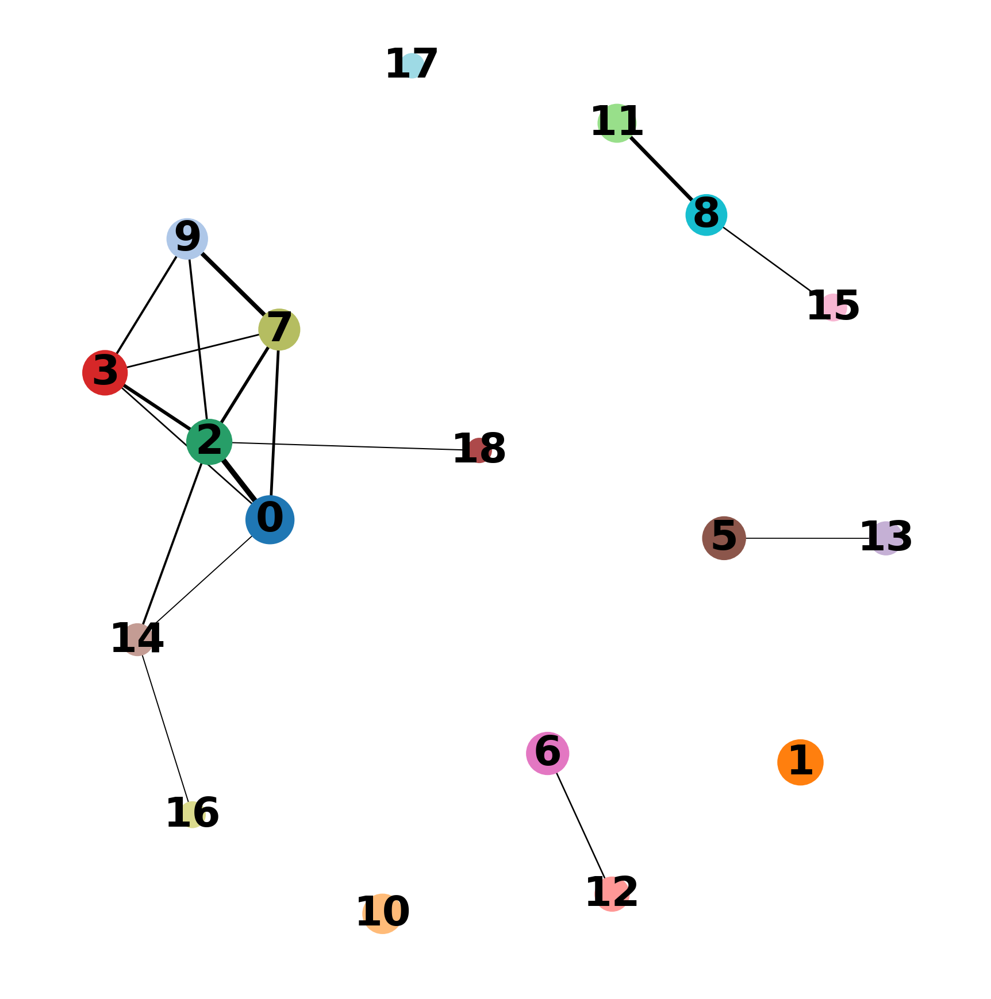

In [74]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.tl.paga(adata)
sc.pl.paga(
    adata, threshold=0.075, title='', edge_width_scale=0.5,
    frameon=False, save=True
)


In [75]:
# re-compute UMAP using paga as initial position
sc.tl.umap(adata, min_dist=0.35, init_pos='paga')

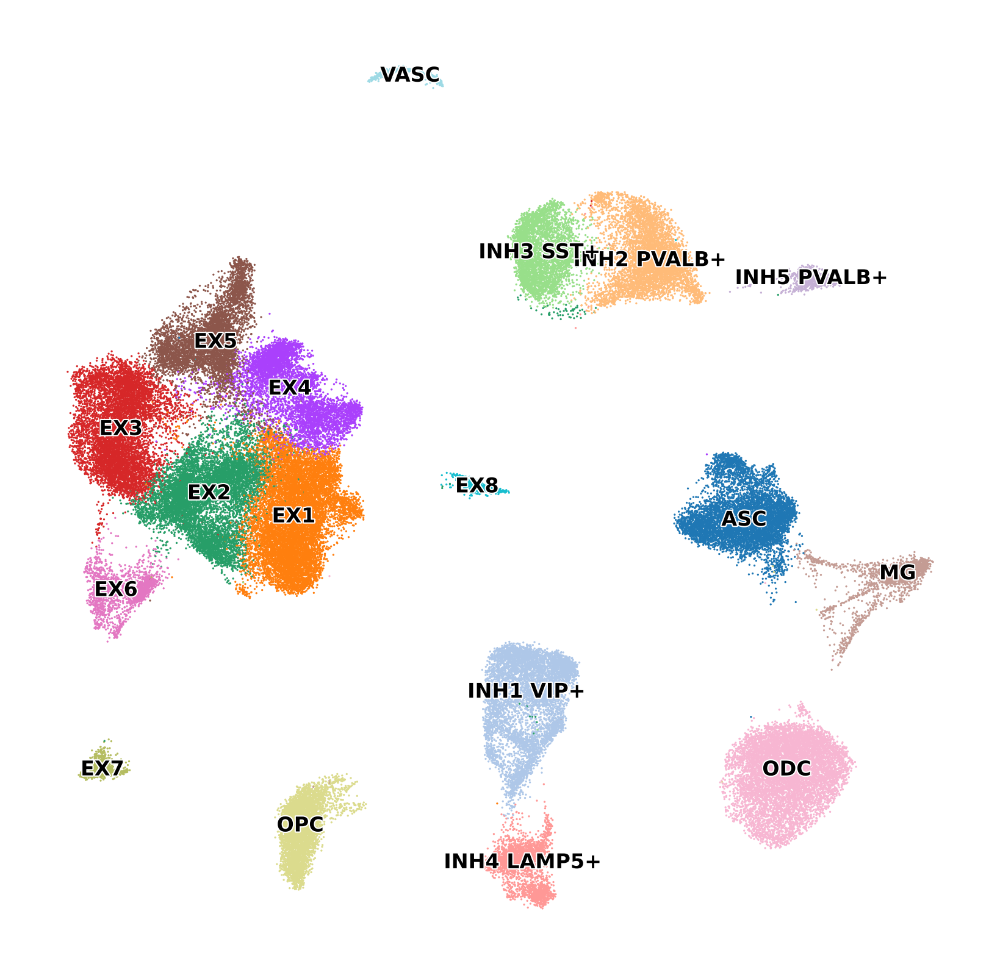

In [76]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    title='',
    save='_annotation_paga.pdf'
)


## Save processed data:

In [77]:
# write anndata:
adata.write_h5ad('{}/Nagy_2020_processed.h5ad'.format(data_dir))

In [78]:
# write obs table 
adata.obs['UMAP_1'] = adata.obsm['X_umap'][:,0]
adata.obs['UMAP_2'] = adata.obsm['X_umap'][:,1]
adata.obs.to_csv('{}/Nagy_2020_processed_obs.csv'.format(data_dir))

# write var table:
adata.var.to_csv('{}/Nagy_2020_processed_var.csv'.format(data_dir))

In [79]:
# save the sparse matrix for Seurat:
X = adata.layers['counts']
X = scipy.sparse.csr_matrix.transpose(X)
io.mmwrite('{}/Nagy_2020_counts.mtx'.format(data_dir), X)

In [80]:
# save the Harmony Matrix for Seurat:
pd.DataFrame(adata.obsm['X_pca_harmony']).to_csv('{}/Nagy_2020_processed_harmony.csv'.format(data_dir))


## Test loading scDRS into the adata:

In [4]:
adata.shape

(86114, 36601)

In [9]:
scdrs_df = pd.read_table("data/UKB_460K.cov_EDU_YEARS.score", sep='\t')
scdrs_df.head()

,Unnamed: 0,raw_score,norm_score,mc_pval,pval,nlog10_pval,zscore
0,CAGGTGCGTTACGCGC-0,4.843775,-0.215515,0.761905,0.587909,0.230690,-0.222169
1,TAAACCGTCCGGCACA-0,5.396036,-0.141041,0.857143,0.540418,0.267271,-0.101486
2,CCTAAAGAGTTGAGTA-0,5.786629,0.069295,0.761905,0.416574,0.380308,0.210667
3,TTGAACGTCGCTGATA-0,6.228205,0.341241,0.523810,0.302000,0.519993,0.518657
4,GGCAATTAGCTAGTCT-0,7.302859,0.633902,0.380952,0.227698,0.642641,0.746449


In [15]:
adata.obs['scDRS_pval'] = scdrs_df['pval'].to_list()
adata.obs['scDRS_score'] = scdrs_df['norm_score'].to_list()

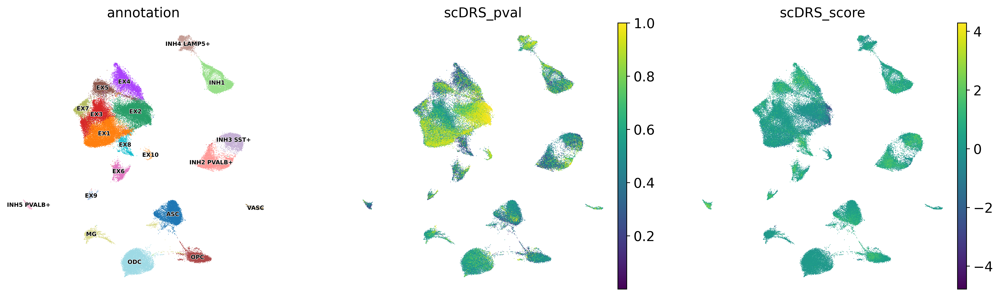

In [16]:
sc.settings.set_figure_params(dpi=200, dpi_save=1000, figsize=(5,5), facecolor='white')
sc.pl.umap(
    adata, 
    color=['annotation', 'scDRS_pval', 'scDRS_score'],
    frameon=False, 
    legend_loc='on data', 
    legend_fontoutline=.75, 
    legend_fontsize=6, 
    save='_scDRS.pdf'
)


In [12]:
adata.obs.head()

,n_counts,doublet_scores,doublets,Sample,Study,orig_barcode,batch,barcode,GEO_Accession (exp),Group,...,sex,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,annotation,scDRS_pval,scDRS_score
CAGGTGCGTTACGCGC-0,20828.0,0.214953,Singlet,GSM4281977,Nagy_2020,CAGGTGCGTTACGCGC,0,CAGGTGCGTTACGCGC-0,GSM4281977,Major Depressive Disorder (MDD),...,male,4274,20828.0,182.0,0.873824,1,EX,EX2,NaN,NaN
TAAACCGTCCGGCACA-0,20777.0,0.140909,Singlet,GSM4281977,Nagy_2020,TAAACCGTCCGGCACA,0,TAAACCGTCCGGCACA-0,GSM4281977,Major Depressive Disorder (MDD),...,male,3983,20777.0,4.0,0.019252,0,EX,EX1,NaN,NaN
CCTAAAGAGTTGAGTA-0,20733.0,0.214953,Singlet,GSM4281977,Nagy_2020,CCTAAAGAGTTGAGTA,0,CCTAAAGAGTTGAGTA-0,GSM4281977,Major Depressive Disorder (MDD),...,male,3938,20733.0,58.0,0.279747,2,ODC,ODC,NaN,NaN
TTGAACGTCGCTGATA-0,20719.0,0.157635,Singlet,GSM4281977,Nagy_2020,TTGAACGTCGCTGATA,0,TTGAACGTCGCTGATA-0,GSM4281977,Major Depressive Disorder (MDD),...,male,3845,20719.0,11.0,0.053091,16,EX,EX8,NaN,NaN
GGCAATTAGCTAGTCT-0,20690.0,0.093750,Singlet,GSM4281977,Nagy_2020,GGCAATTAGCTAGTCT,0,GGCAATTAGCTAGTCT-0,GSM4281977,Major Depressive Disorder (MDD),...,male,3841,20690.0,53.0,0.256162,8,EX,EX4,NaN,NaN
